In [1]:
### IMPORT SCIENTIFIC LIBRARIES ###
import numpy as np
import pandas as pd
from scipy import sparse
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
plt.rcParams['font.size'], plt.rcParams['axes.labelsize'] = 14, 18
#%matplotlib widget

import os, sys, importlib
sys.path.append('./XPCS_library/')

import ID10_tools as ID10
from ID10_tools import Nx, Ny, Npx
importlib.reload(ID10)
ID10.set_version('v2')

import XPCS_tools as XPCS
from XPCS_tools import E2lambda, lambda2E, theta2Q, Q2theta, decorrelation_f
importlib.reload(XPCS)
XPCS.set_beamline('ID10')

import COSMICRAY_tools as COSMIC
importlib.reload(COSMIC)
COSMIC.set_beamline('ID10')

# RAW FOLDER PATH
raw_folder = '../RAW_DATA/'
mask_folder = '../masks/'
fit_out_folder = './data/fit_outs/'
Idt_folder = './data/Idts/'
g2_folder = './data/g2/'

# EXPERIMENTAL VARIABLES
XPCS.set_expvar(1350, 1350, 7)
ID10.Nfmax_dense_file = 2000
ID10.Nfmax_sparse_file = 5000

## Load masks

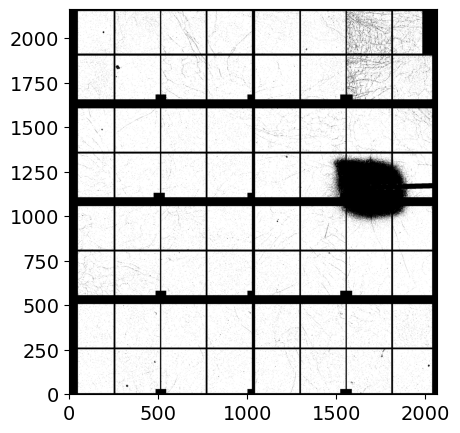

In [2]:
e4m_htmask = np.load(mask_folder+'e4m_htmask_copper_foil_30um_1_1'+'.npy')
e4m_mask = np.load(mask_folder+'e4m_mask'+'.npy')

plt.figure(figsize=(5, 5))
plt.imshow((e4m_mask*e4m_htmask).reshape(Nx,Ny), cmap='gray', origin='lower')

## BS mask and Q definition
Using a random scan in GeO2_6, because we are not changing the measurement configuration

#### Beamstop mask

In [3]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan =12
Nfi, Nff = 0, 1000
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

#############################
command = mtimescan 0.02 1 220000
Ei = 9.699998837562536
itime = 0.0201
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0012/
	 | Shape:       (1000, 4471016)
	 | Sparsity:     3.8e-03
	 | Memory usage (scipy.csr_array): 0.192 GB (np.array usage: 16.656 GB)


################################################################################
Maximum count in the hull run -> 4689.0
# of pixels above Ith_high treshold ->  75 pixels (of 4471016 => 0.0 %)
################################################################################



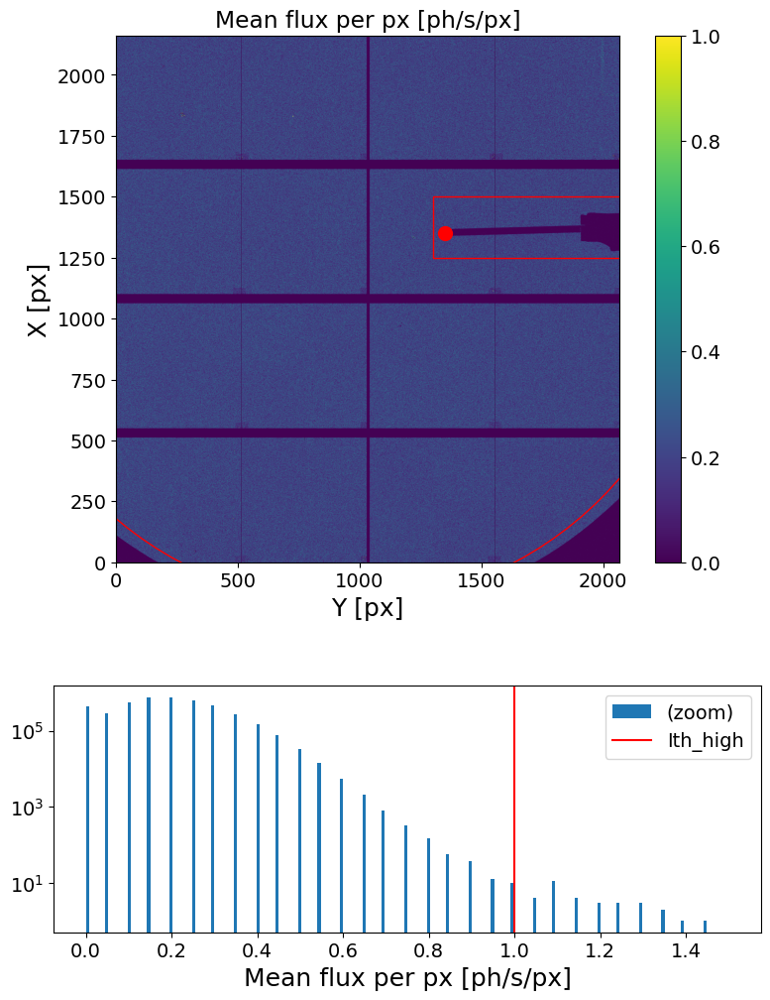

In [4]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=1, Nff=10000, mask_geom=geom,)

#################################################
Masked area =  93.74594052000708 %
#################################################



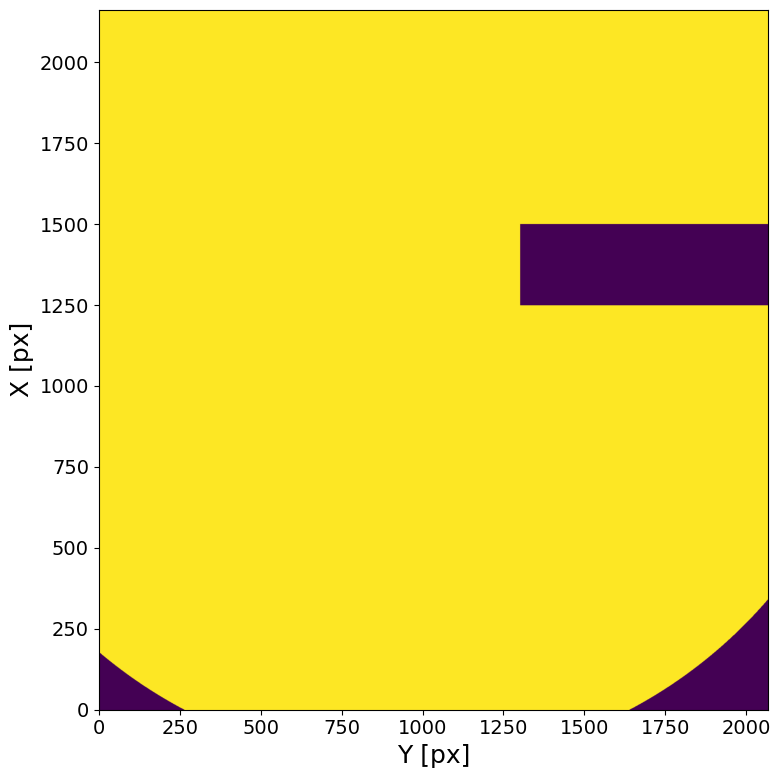

In [5]:
bs_mask = XPCS.gen_mask(mask_geom=geom)

#### Q mask

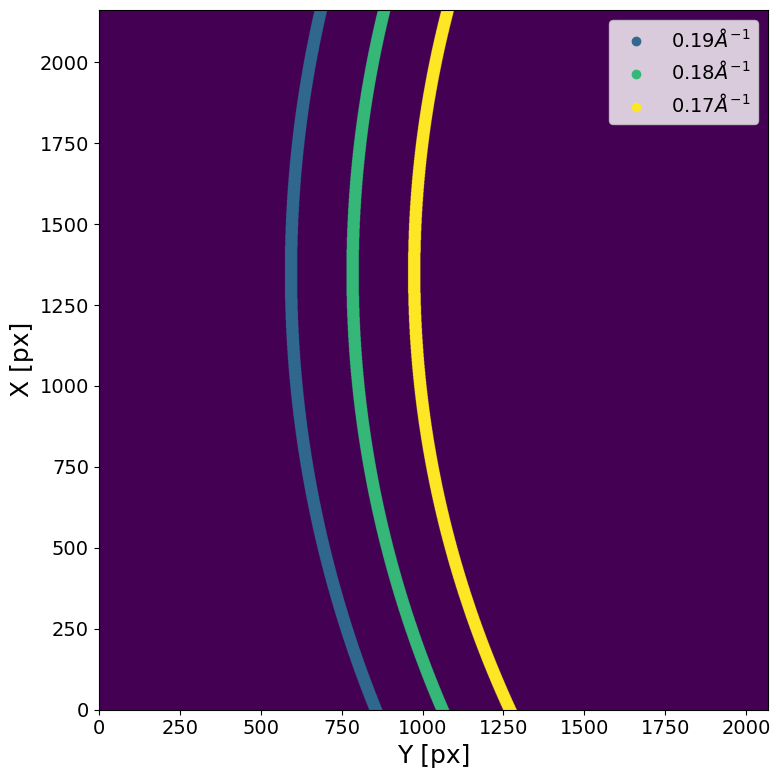

In [17]:
Qmask = XPCS.gen_Qmask(Ei, theta, [.19, 0.18,0.17], .001, Qmap_plot=False)

## XPCS scan (T = 30C, Q =  0.19 Å^{-1}, 3 min @ 200ms (1002fm)) (GeO2_6, dataset 1, scan 7) fresh point

In [20]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan = 7
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.2 1 1002
Ei = 9.699998837562536
itime = 0.200112
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1 loops)


Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0007/
	 | Shape:       (1002, 1427140)
	 | Sparsity:     3.9e-02
	 | Memory usage (scipy.csr_array): 0.618 GB (np.array usage: 5.327 GB)
Filtering gamma ray signal (i.e. signals over treshold) ...
Done! (elapsed time = 0.25 s)
Removing gamma ray signal (set 0s) ...
Done! (elapsed time = 0.42 s)


### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3047168 pixels (of 4471016 => 68.15 %)
################################################################################



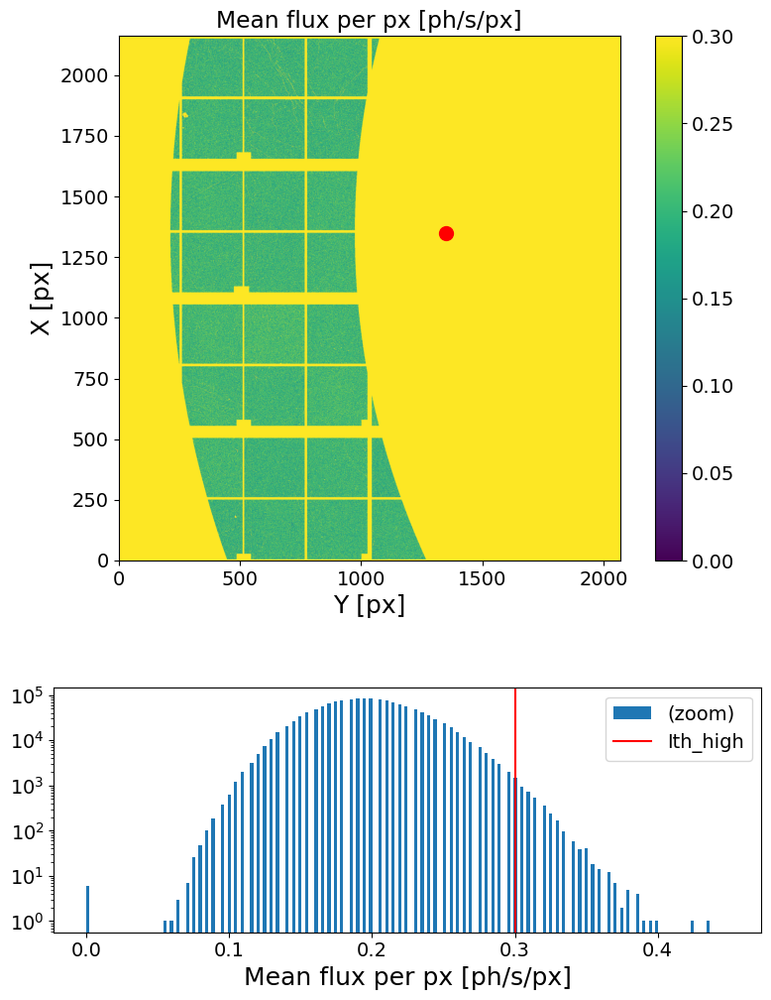

In [22]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, load_mask=load_mask)

### Intensity analysis

In [23]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

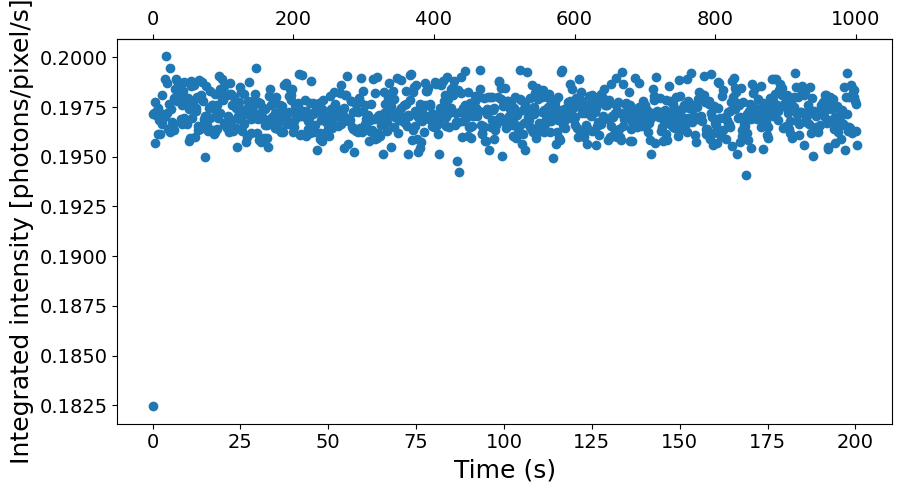

In [24]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [25]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 0.99 s)
Computing G2t (using MKL library)...


Done! (elapsed time = 2.27 s)
	 | 1001 X 1001 squared matrix
	 | memory usage (np.array @ float32) = 0.004 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.03 s)



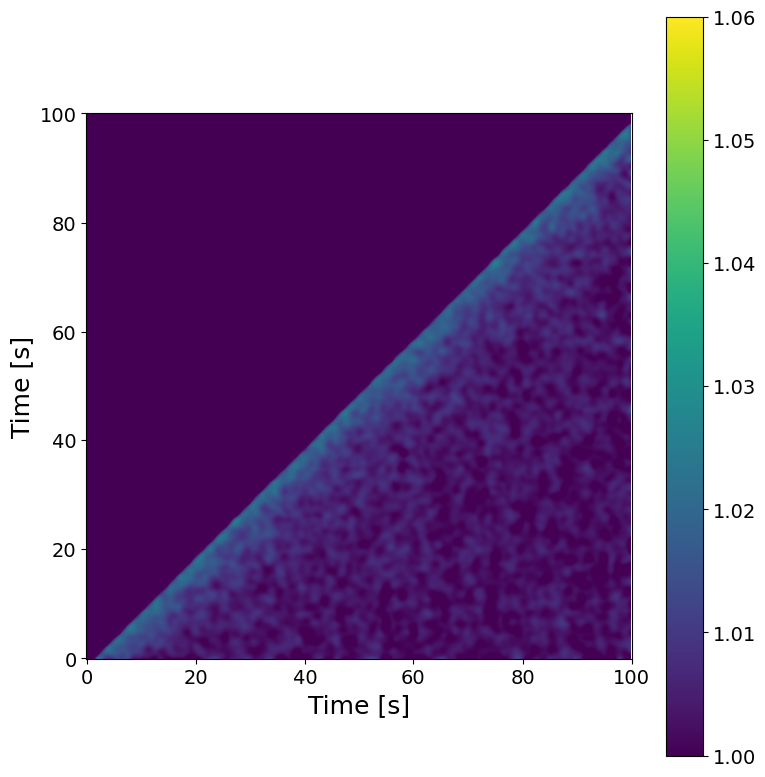

In [26]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [27]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 0.01 s)



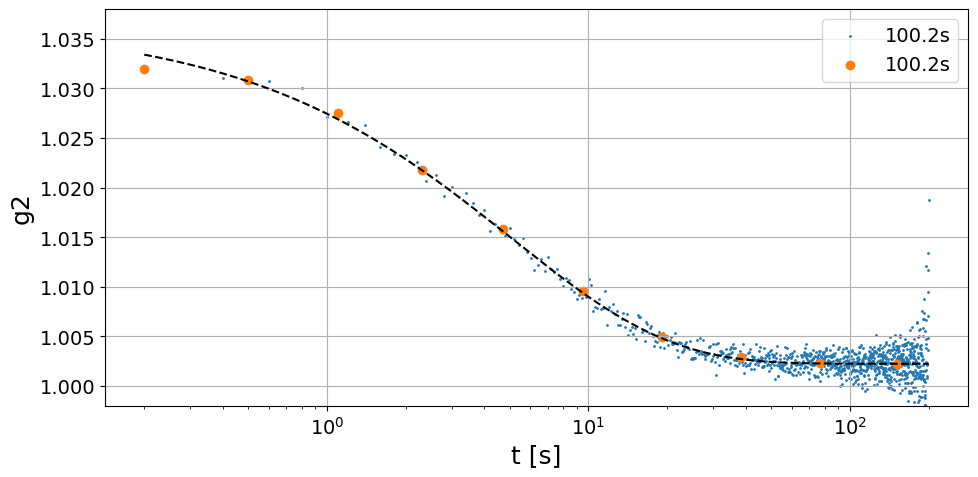

tau = 5.0947 +/- 0.4522
beta = 0.7209 +/- 0.0437
c = 0.0343 +/- 0.0018
y0 = 1.0022 +/- 0.0001


In [30]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorrelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorrelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

## XPCS scan (T = 30C, Q =  0.19 Å$^{-1}$, 20 min @ 200ms (6000fm)) (GeO2_6, dataset 1, scan 8) same point

In [215]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan = 8
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.2 1 6000
Ei = 9.699998837562536
itime = 0.200112
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/2 loops)


	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/2 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0008/
	 | Shape:       (6000, 1427140)
	 | Sparsity:     3.9e-02
	 | Memory usage (scipy.csr_array): 3.692 GB (np.array usage: 31.899 GB)
Filtering gamma ray signal (i.e. signals over treshold) ...
Done! (elapsed time = 1.4 s)
Removing gamma ray signal (set 0s) ...
Done! (elapsed time = 1.88 s)


### Flux check

In [216]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [217]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

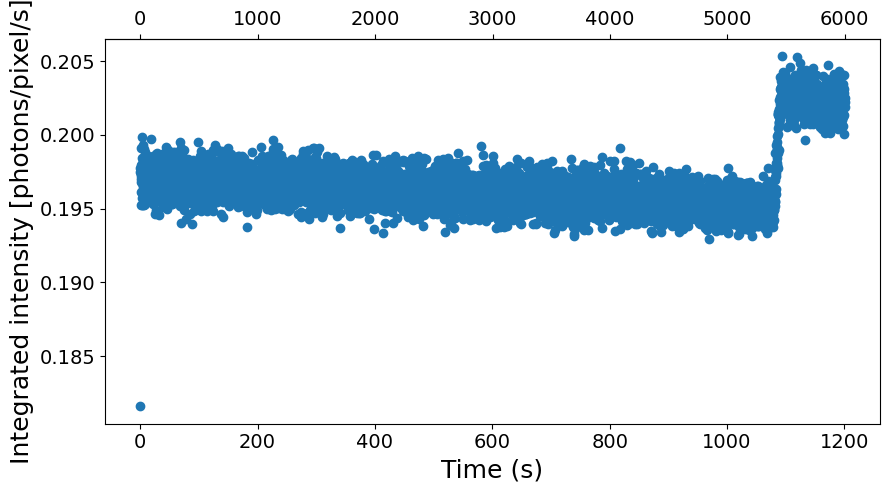

In [218]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [219]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...


Done! (elapsed time = 3.59 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 16.45 s)
	 | 5999 X 5999 squared matrix
	 | memory usage (np.array @ float32) = 0.134 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.12 s)



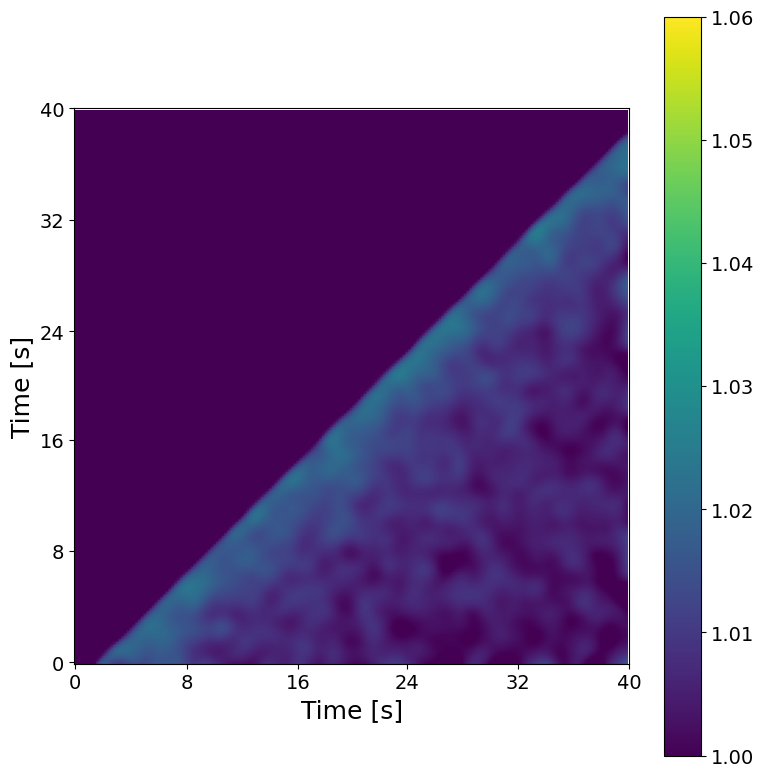

In [220]:
############################
t1, t2 = 0, 40
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [221]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 0.17 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


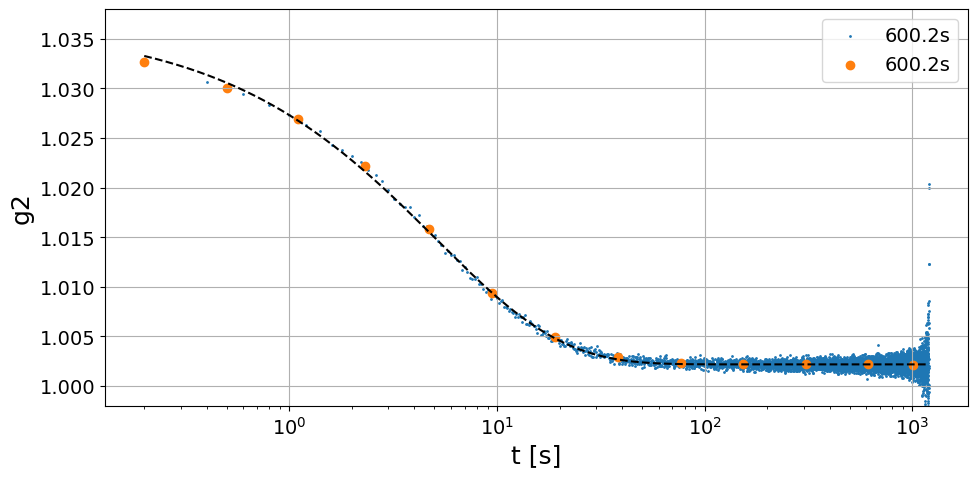

tau = 5.0949 +/- 0.1975
beta = 0.7164 +/- 0.0181
c = 0.0343 +/- 0.0008
y0 = 1.0022 +/- 0.0


In [222]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

## XPCS scan (T = 30 C, Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 9) same point

In [223]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan = 9
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file	 -> loading file  eiger4m_v2_sparse_frame_0_00011.h5eiger4m_v2_sparse_frame_0_00010.h5  (12/12 loops)(11/12 loops)

	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
Done!
Conc

### Flux check

In [224]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [225]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

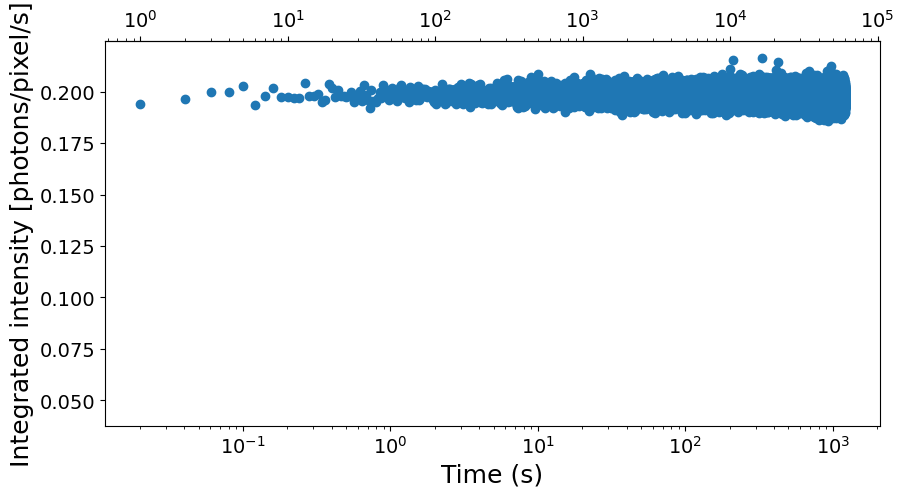

In [226]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.xscale('log')

### Correlation

In [227]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...


Done! (elapsed time = 3.53 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 23.71 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.76 s)



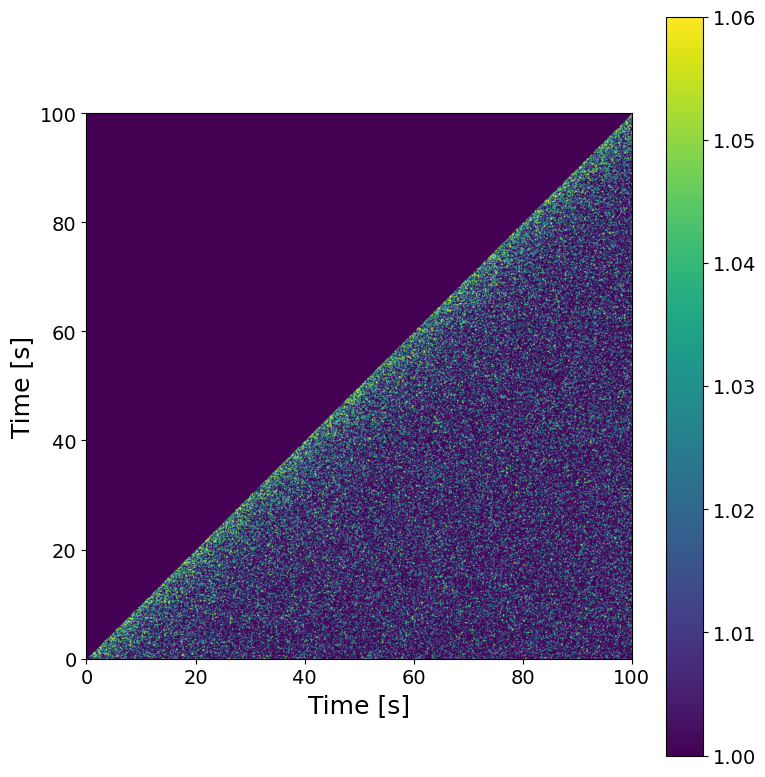

In [228]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [229]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...


Done! (elapsed time = 7.41 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


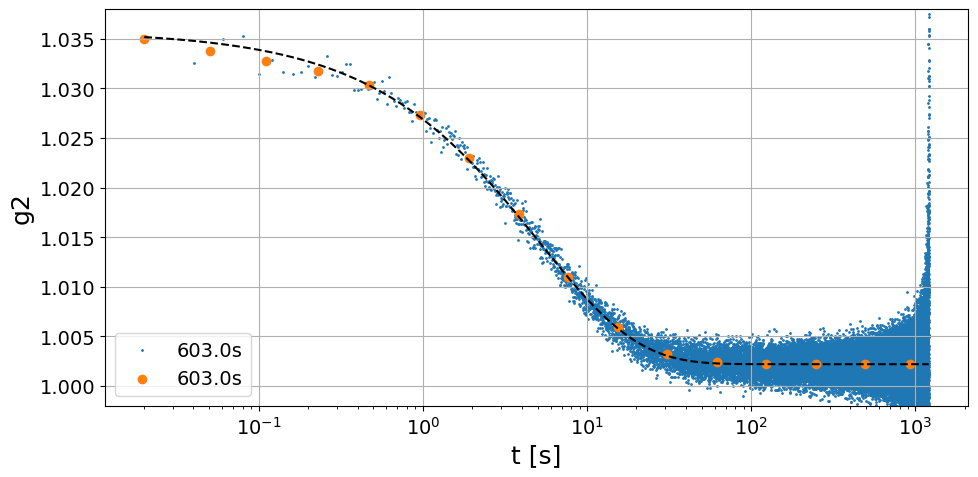

tau = 5.0926 +/- 0.2153
beta = 0.7246 +/- 0.0208
c = 0.0336 +/- 0.0008
y0 = 1.0022 +/- 0.0


In [230]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

## XPCS scan (T = 30 C, Q =  0.19 Å$^{-1}$, 5 min @ 20ms (15000fm)) (GeO2_6, dataset 1, scan 11) fresh point

In [231]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan =11
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 15000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/3 loops)


	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/3 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/3 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0011/
	 | Shape:       (15000, 1427140)
	 | Sparsity:     4.0e-03
	 | Memory usage (scipy.csr_array): 0.968 GB (np.array usage: 79.748 GB)
Filtering gamma ray signal (i.e. signals over treshold) ...
Done! (elapsed time = 0.36 s)
Removing gamma ray signal (set 0s) ...
Done! (elapsed time = 0.47 s)


### Flux check

In [232]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [233]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

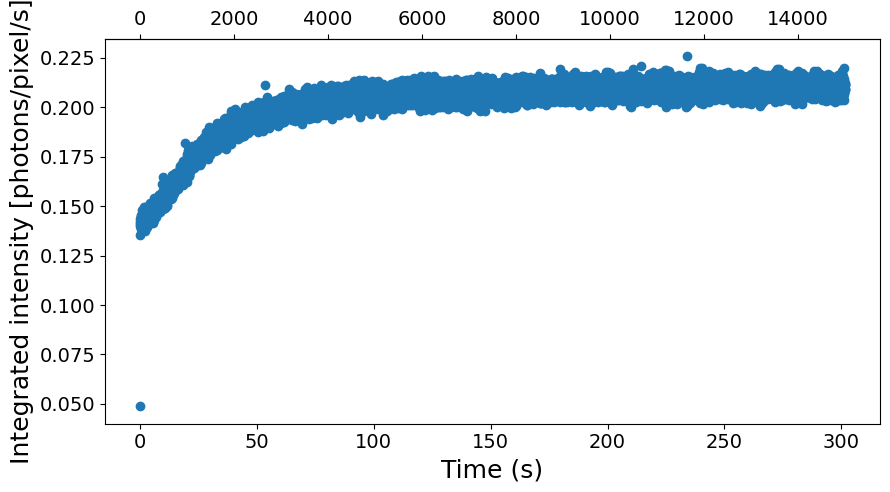

In [234]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [235]:
###################
Nfi = 4000
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 0.69 s)
Computing G2t (using MKL library)...


Done! (elapsed time = 2.8 s)
	 | 11000 X 11000 squared matrix
	 | memory usage (np.array @ float32) = 0.451 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.11 s)



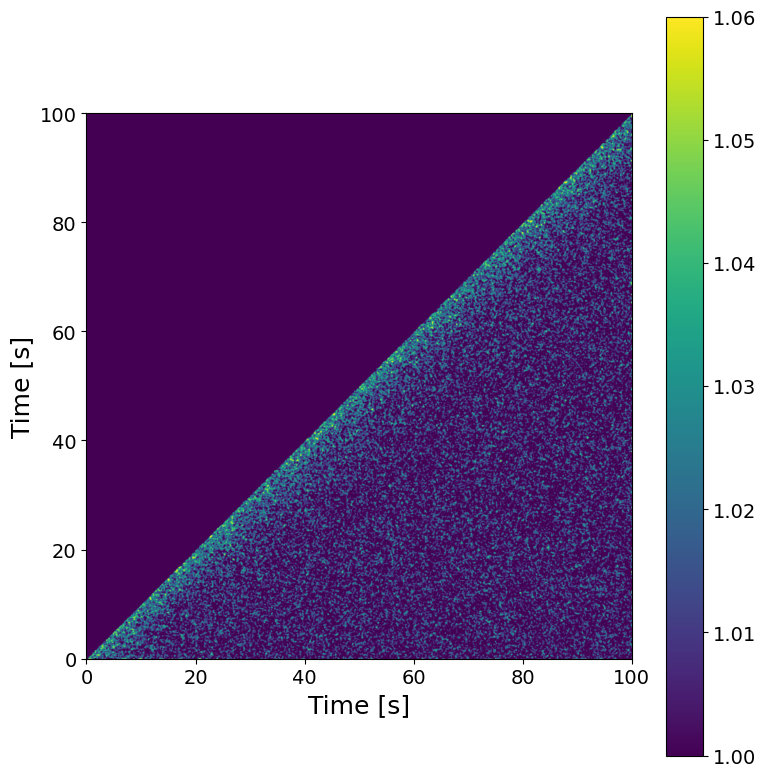

In [236]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=5)

In [237]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 0.18 s)



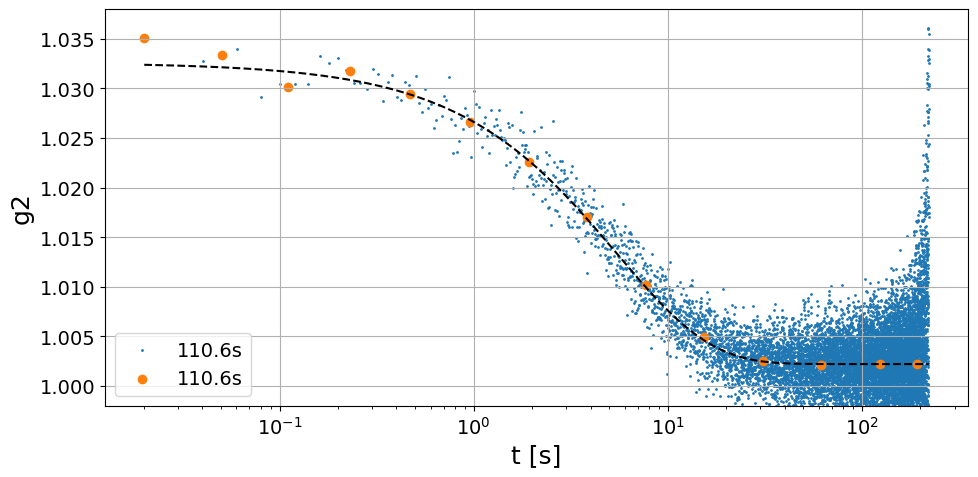

tau = 5.4469 +/- 0.3792
beta = 0.8979 +/- 0.0598
c = 0.0304 +/- 0.0014
y0 = 1.0022 +/- 0.0001


In [238]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

## XPCS scan (T = 30C, Q =  0.19 Å$^{-1}$, 75 min @ 20ms (220000fm)) (GeO2_6, dataset 1, scan 12) same point

In [239]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan =12
Nfi, Nff = 100000, 200000
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 220000
Ei = 9.699998837562536
itime = 0.0201
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00020.h5 (21/21 loops)


	 -> loading file eiger4m_v2_sparse_frame_0_00021.h5 (22/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00022.h5 (23/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00023.h5 (24/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00024.h5 (25/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00025.h5 (26/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00026.h5 (27/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00027.h5 (28/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00031.h5 (32/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00035.h5 (36/21 lo

### Flux check

In [240]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [241]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

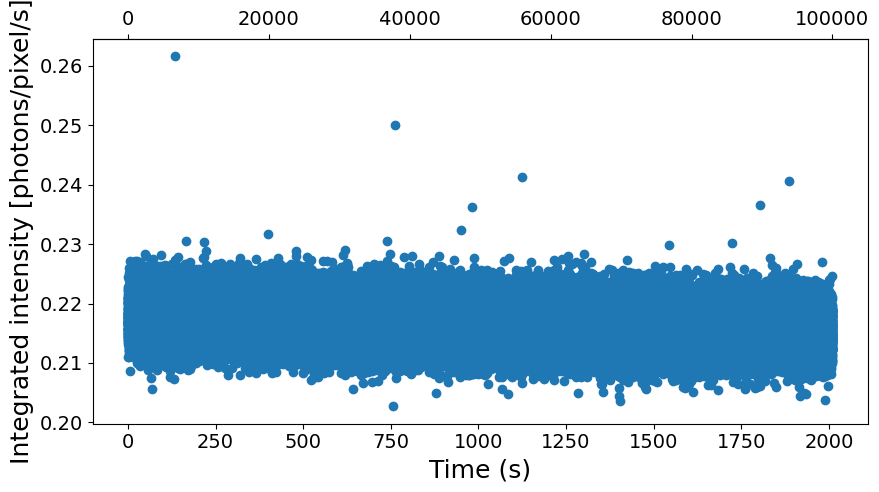

In [242]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [243]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...


Done! (elapsed time = 6.43 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 49.64 s)
	 | 99999 X 99999 squared matrix
	 | memory usage (np.array @ float32) = 37.252 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 4.53 s)



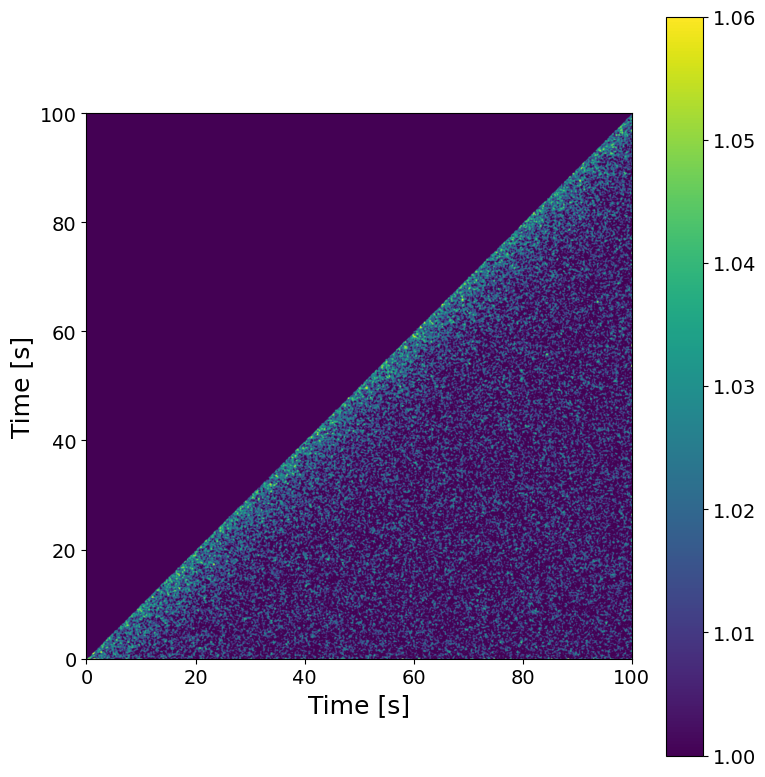

In [244]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=5)

In [245]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 20.13 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


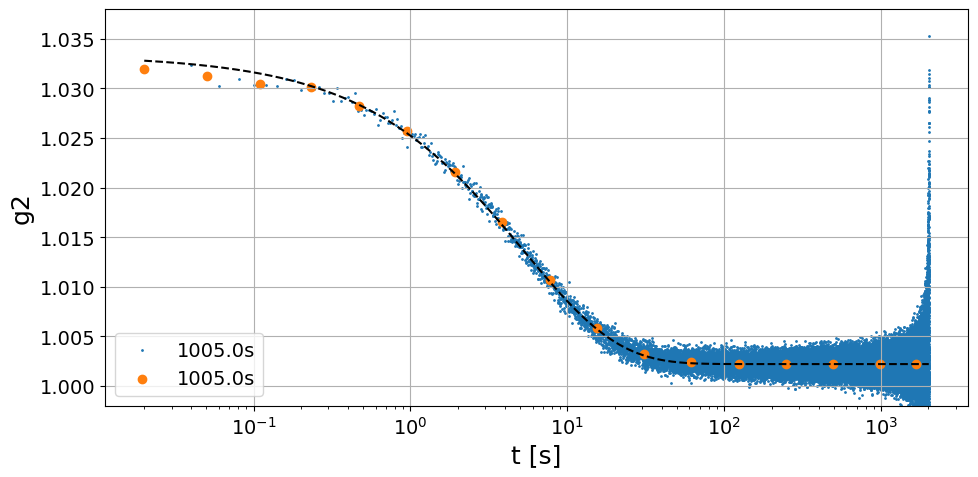

tau = 5.2467 +/- 0.1744
beta = 0.7222 +/- 0.0162
c = 0.0311 +/- 0.0006
y0 = 1.0022 +/- 0.0


In [246]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

## XPCS scan ( T = 100 C, Q = 0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 3)

In [247]:
#######################################
sample_name = 'GeO2_6_100C'
Ndataset = 1
Nscan =3
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)


	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6_100C/GeO2_6_100C_0001/scan0003/
	 | Shape:       (60000, 1427140)
	 | Sparsity:     4.2e-03
	 | Memory usage (scipy.csr_array): 4.009 GB (np.array usage: 318.991 GB)
Filtering gamma ray

### Flux check

In [248]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [249]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

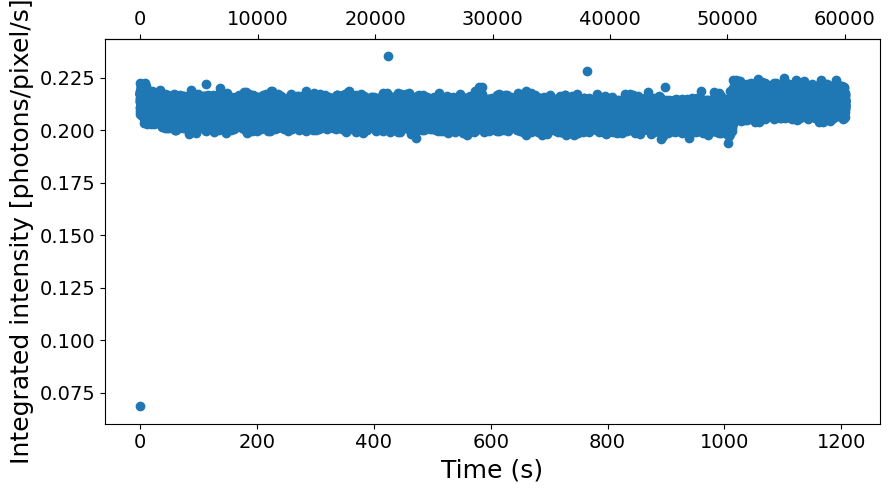

In [250]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [251]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 3.77 s)
Computing G2t (using MKL library)...


Done! (elapsed time = 23.9 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.8 s)



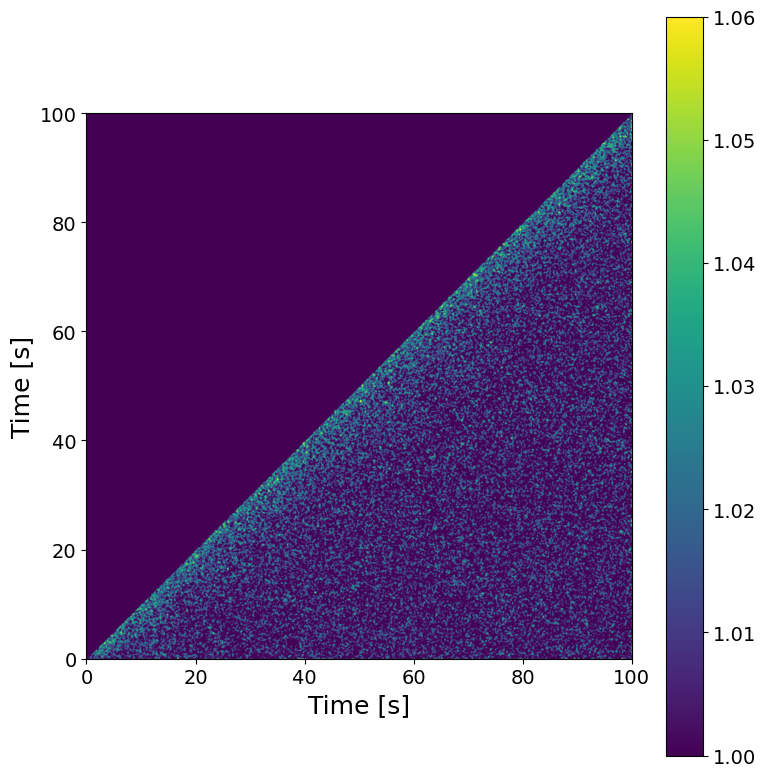

In [252]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=5)

In [253]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 7.27 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


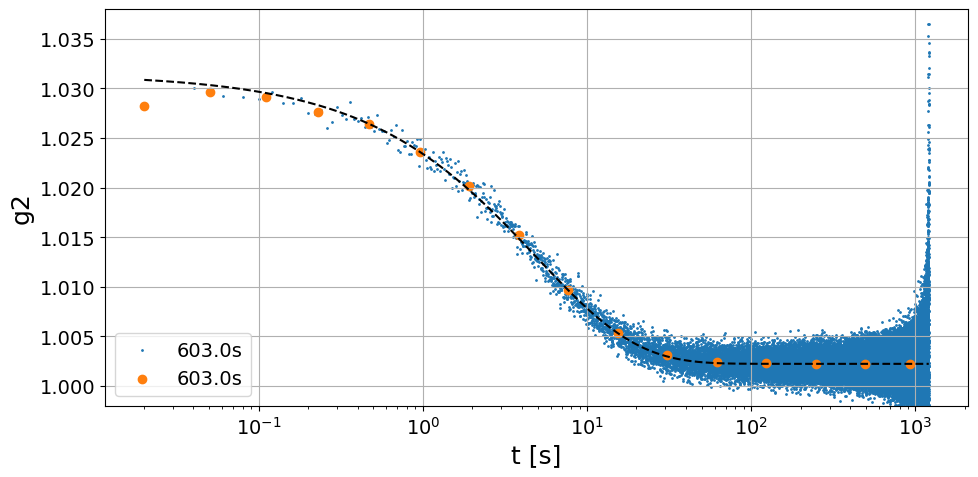

tau = 4.9319 +/- 0.2542
beta = 0.7104 +/- 0.0242
c = 0.0292 +/- 0.0008
y0 = 1.0022 +/- 0.0


In [254]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

## XPCS scan (T = 170 C, Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 1) 

In [255]:
#######################################
sample_name = 'GeO2_6_170C'
Ndataset = 1
Nscan = 1
Nfi, Nff = None,None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)


	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6_170C/GeO2_6_170C_0001/scan0001/
	 | Shape:       (60000, 1427140)
	 | Sparsity:     4.1e-03
	 | Memory usage (scipy.csr_array): 3.930 GB (np.array usage: 318.991 GB)
Filtering gamma ray

### Flux check

In [256]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [257]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

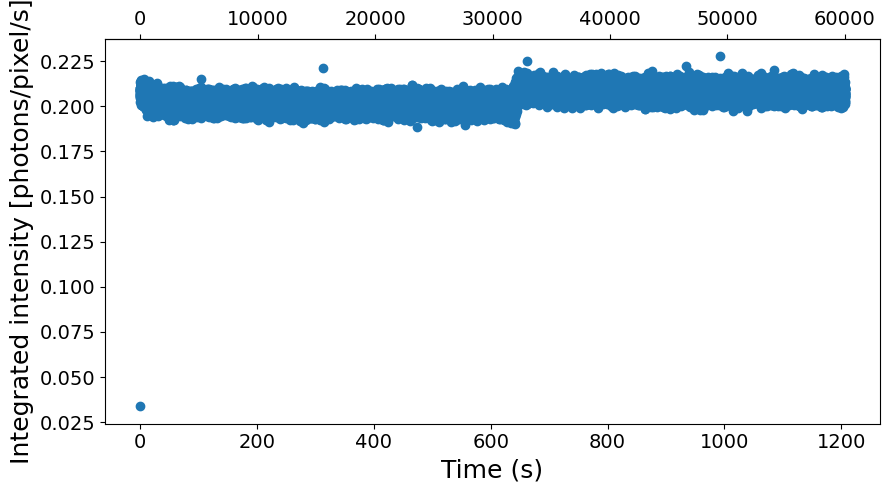

In [258]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [259]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...


Done! (elapsed time = 3.83 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 24.23 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.84 s)



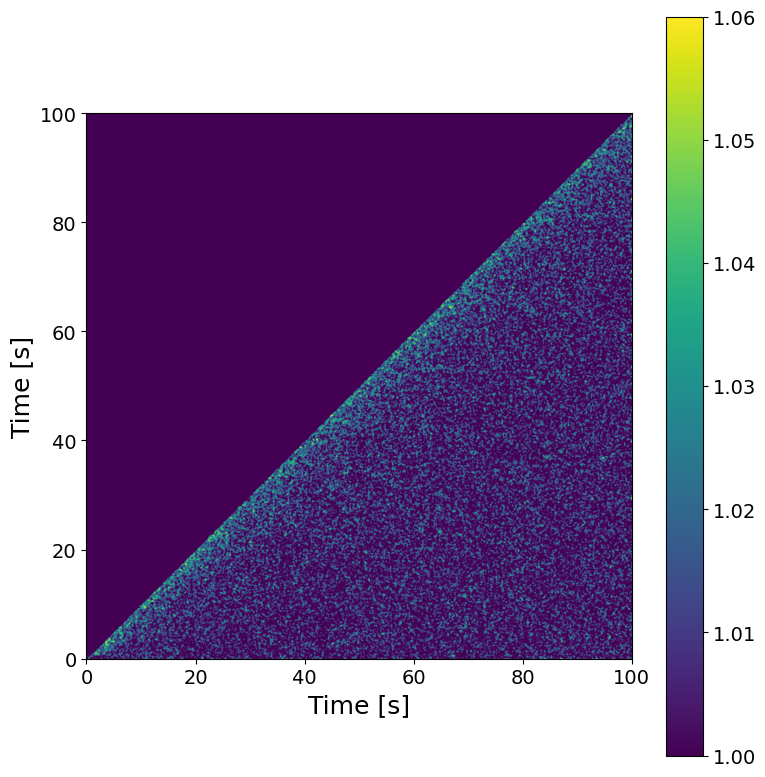

In [260]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=5)

In [261]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 7.62 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


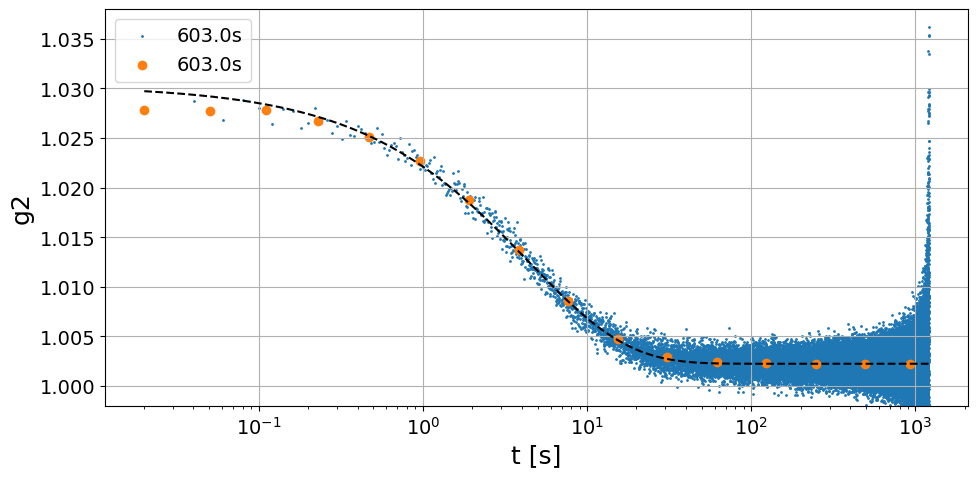

tau = 4.3926 +/- 0.2227
beta = 0.7203 +/- 0.0246
c = 0.028 +/- 0.0008
y0 = 1.0022 +/- 0.0


In [262]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

## XPCS scan ( T = 240 C ,Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 1)

In [263]:
#######################################
sample_name = 'GeO2_6_240C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)


	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6_240C/GeO2_6_240C_0001/scan0003/
	 | Shape:       (60000, 1427140)
	 | Sparsity:     3.9e-03
	 | Memory usage (scipy.csr_array): 3.779 GB (np.array usage: 318.991 GB)
Filtering gamma ray

### Flux check

In [264]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [265]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

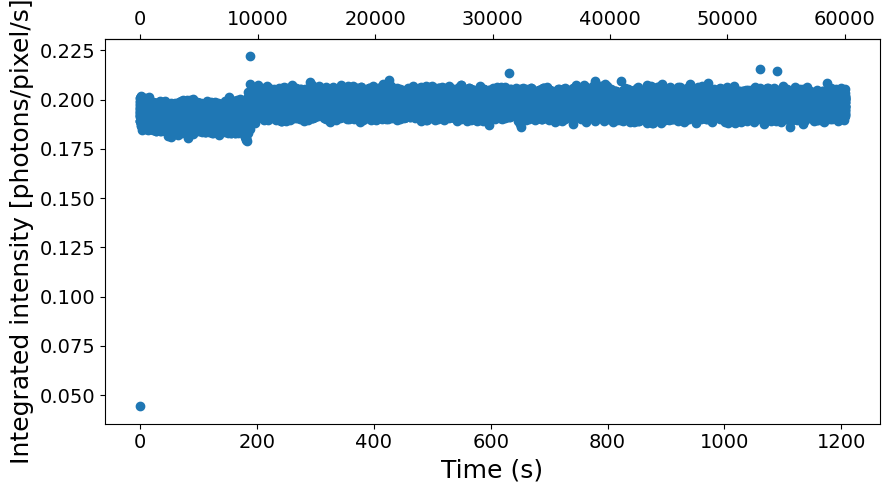

In [266]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [267]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...


Done! (elapsed time = 3.47 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 22.6 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.79 s)



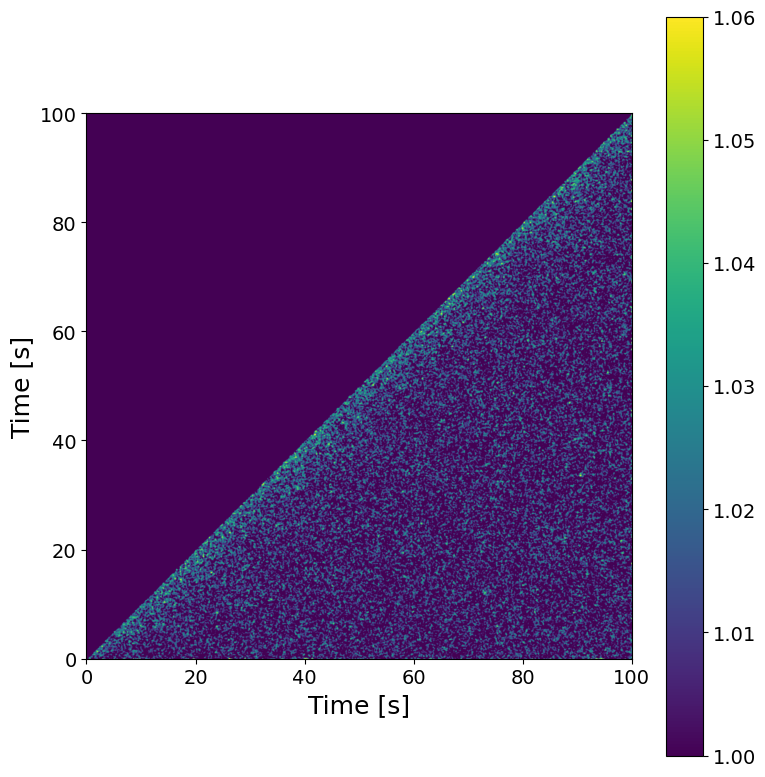

In [268]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=5)

In [269]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 7.63 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


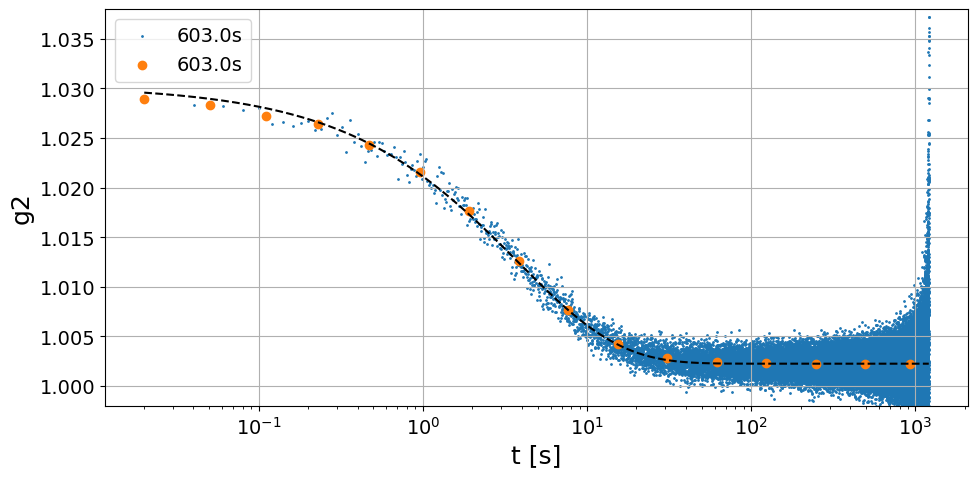

tau = 3.7667 +/- 0.2459
beta = 0.6997 +/- 0.0294
c = 0.028 +/- 0.001
y0 = 1.0022 +/- 0.0


In [270]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan (T = 310 C,, Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 1) 

In [271]:
#######################################
sample_name = 'GeO2_6_310C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)


	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6_310C/GeO2_6_310C_0001/scan0003/
	 | Shape:       (60000, 1427140)
	 | Sparsity:     3.8e-03
	 | Memory usage (scipy.csr_array): 3.665 GB (np.array usage: 318.991 GB)
Filtering gamma ray

### Flux check

In [272]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [273]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

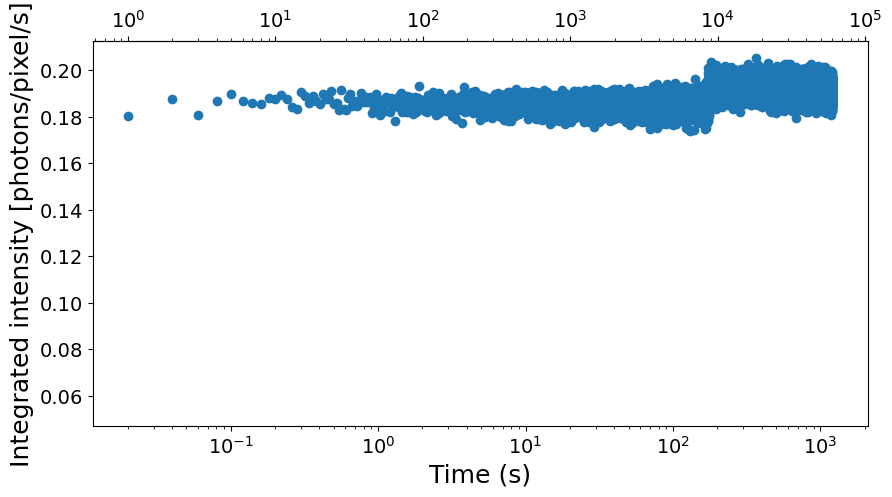

In [274]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.xscale('log')

### Correlation

In [275]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...


Done! (elapsed time = 3.43 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 21.74 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.75 s)



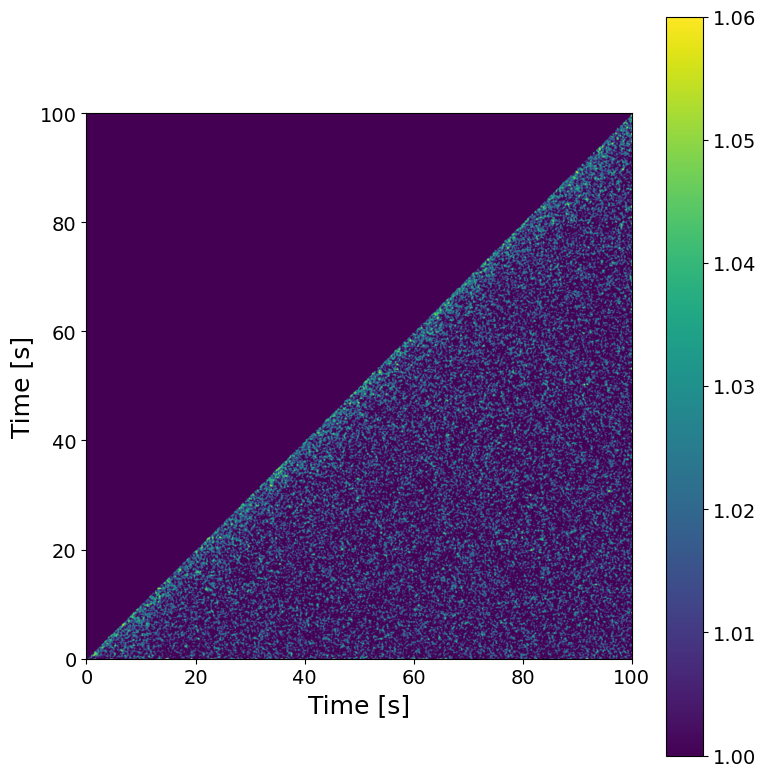

In [276]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=5)

In [277]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 7.42 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


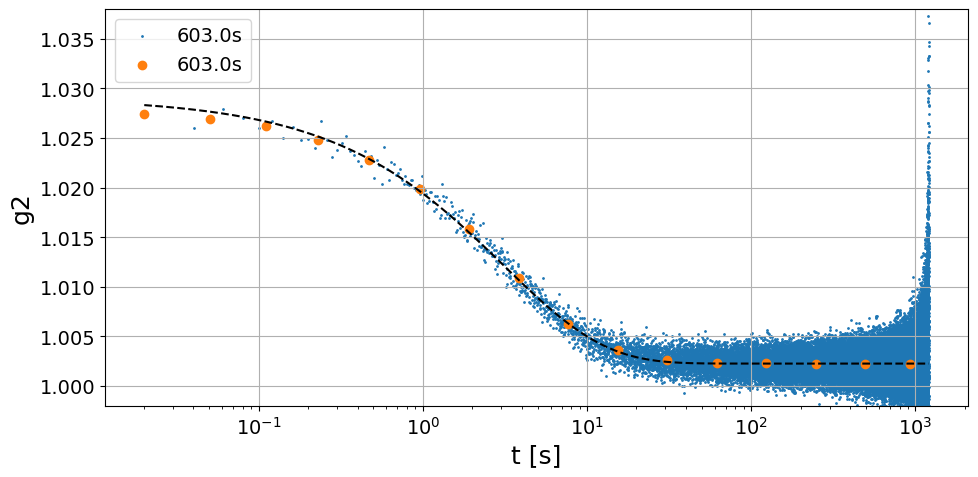

tau = 3.1224 +/- 0.2036
beta = 0.7083 +/- 0.0302
c = 0.0268 +/- 0.001
y0 = 1.0023 +/- 0.0


In [278]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan ( T = 380 C, Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 1)

In [279]:
#######################################
sample_name = 'GeO2_6_380C'
Ndataset = 1
Nscan = 1
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)


	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6_380C/GeO2_6_380C_0001/scan0001/
	 | Shape:       (60000, 1427140)
	 | Sparsity:     3.7e-03
	 | Memory usage (scipy.csr_array): 3.585 GB (np.array usage: 318.991 GB)
Filtering gamma ray

### Flux check

In [280]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [281]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

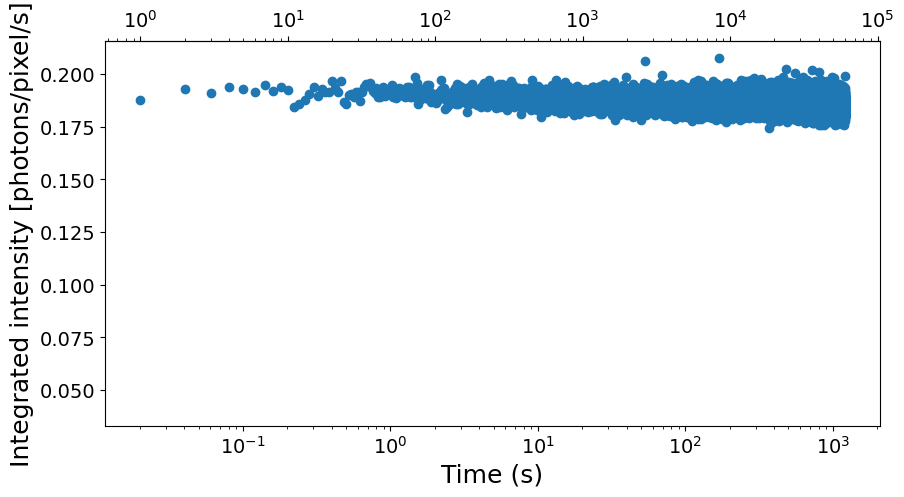

In [282]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.xscale('log')

### Correlation

In [283]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 3.3 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 20.93 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.75 s)



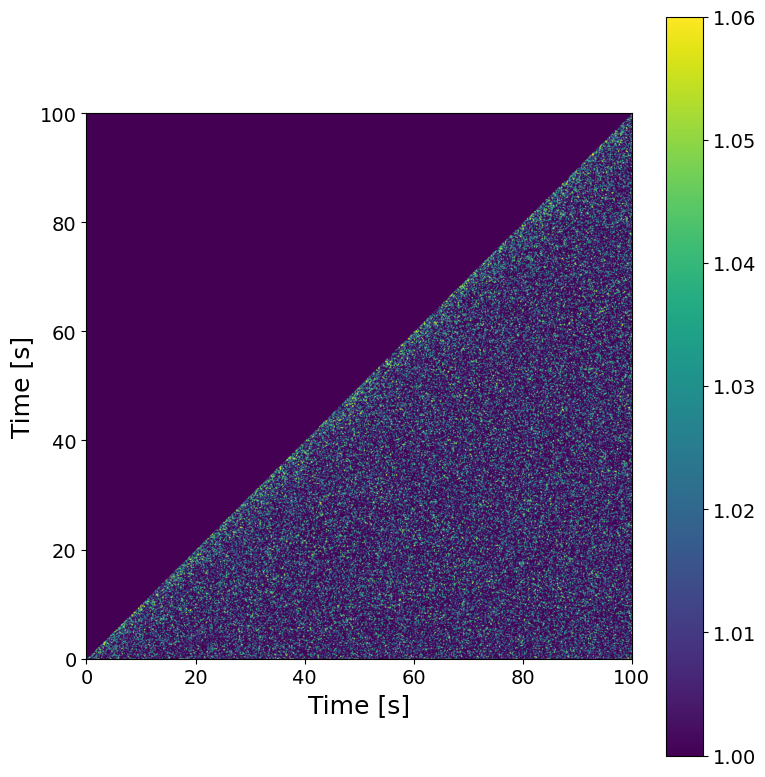

In [284]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [285]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 7.44 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


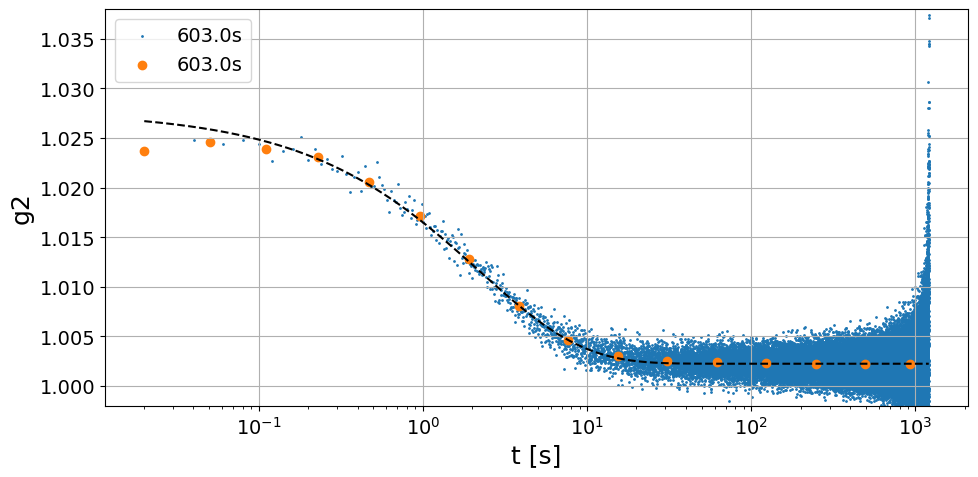

tau = 2.2077 +/- 0.2082
beta = 0.6905 +/- 0.0409
c = 0.0254 +/- 0.0013
y0 = 1.0022 +/- 0.0


In [286]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan ( T = 450 C, Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 1)

In [287]:
#######################################
sample_name = 'GeO2_6_450C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Conc

### Flux check

In [288]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [289]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

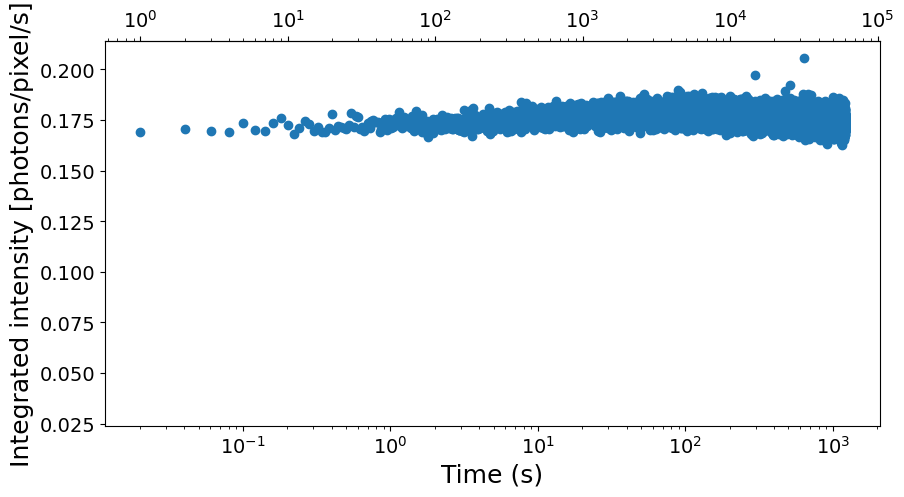

In [290]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.xscale('log')

### Correlation

In [291]:
###################
Nfi = 4000
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 2.96 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 18.43 s)
	 | 56000 X 56000 squared matrix
	 | memory usage (np.array @ float32) = 11.683 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.57 s)



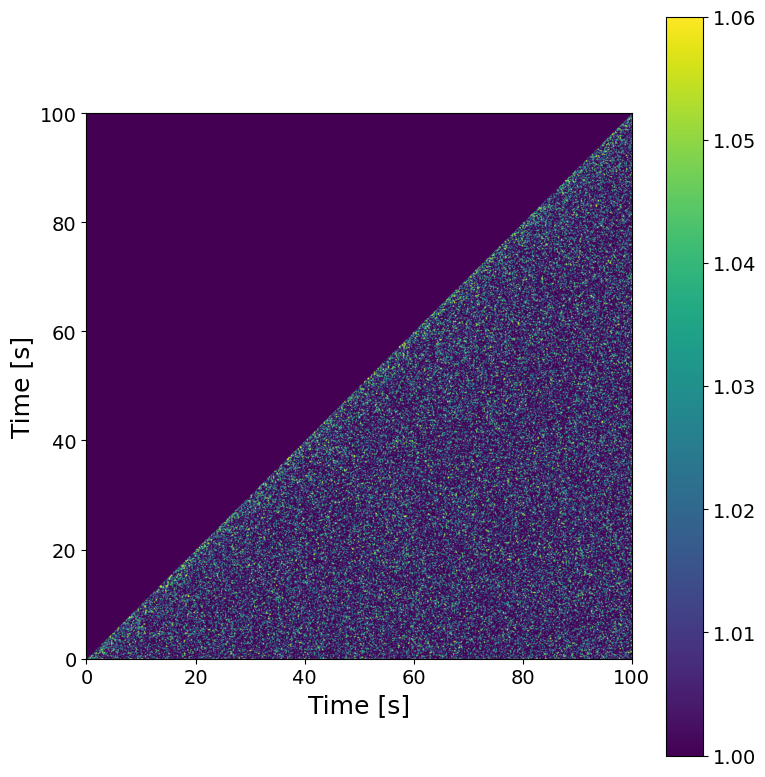

In [292]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [293]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 5.73 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


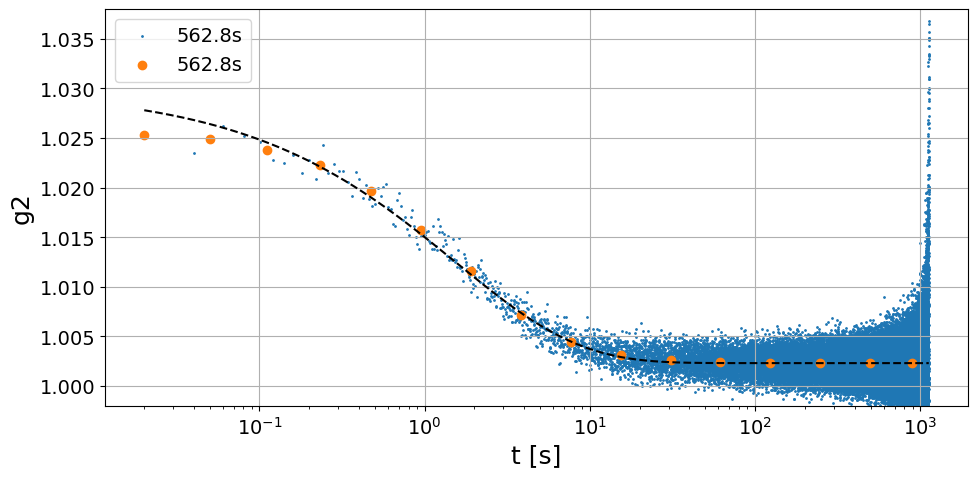

tau = 1.5451 +/- 0.2057
beta = 0.5815 +/- 0.0372
c = 0.0276 +/- 0.0018
y0 = 1.0023 +/- 0.0


In [294]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan (T = 520 C, Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 1) 

In [295]:
#######################################
sample_name = 'GeO2_6_520C'
Ndataset = 1
Nscan = 1
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Conc

### Flux check

In [296]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [297]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

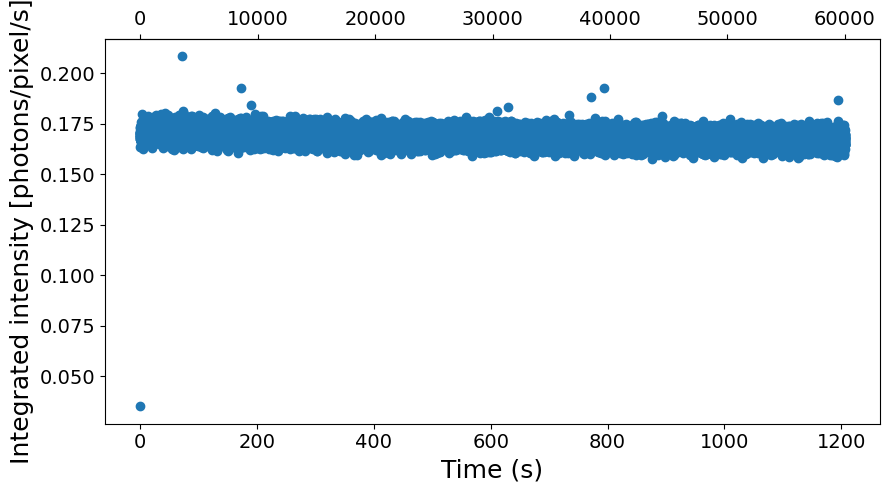

In [298]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [299]:
###################
Nfi = 1
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 3.01 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 19.36 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.78 s)



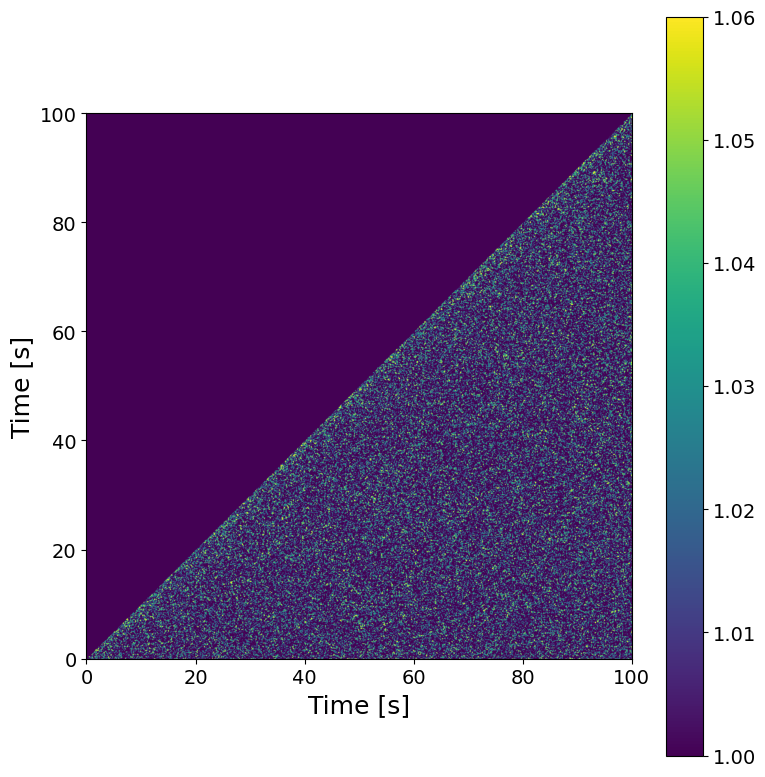

In [300]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [301]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 7.43 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


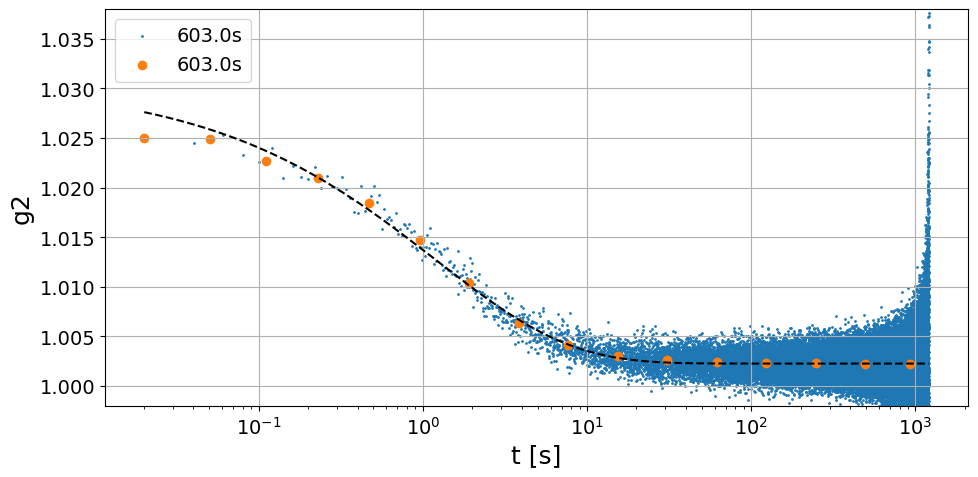

tau = 1.2021 +/- 0.2124
beta = 0.5342 +/- 0.0397
c = 0.0284 +/- 0.0023
y0 = 1.0023 +/- 0.0


In [302]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan (T = 590 C, Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 1) 

In [303]:
#######################################
sample_name = 'GeO2_6_590C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Conc

### Flux check

In [304]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [305]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

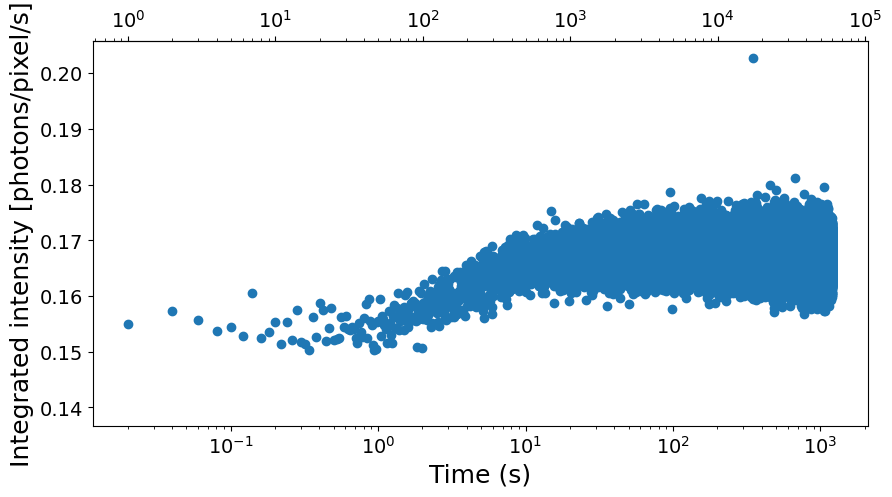

In [306]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.xscale('log')

### Correlation

In [307]:
###################
Nfi = 4000
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 2.79 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 17.0 s)
	 | 56000 X 56000 squared matrix
	 | memory usage (np.array @ float32) = 11.683 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.51 s)



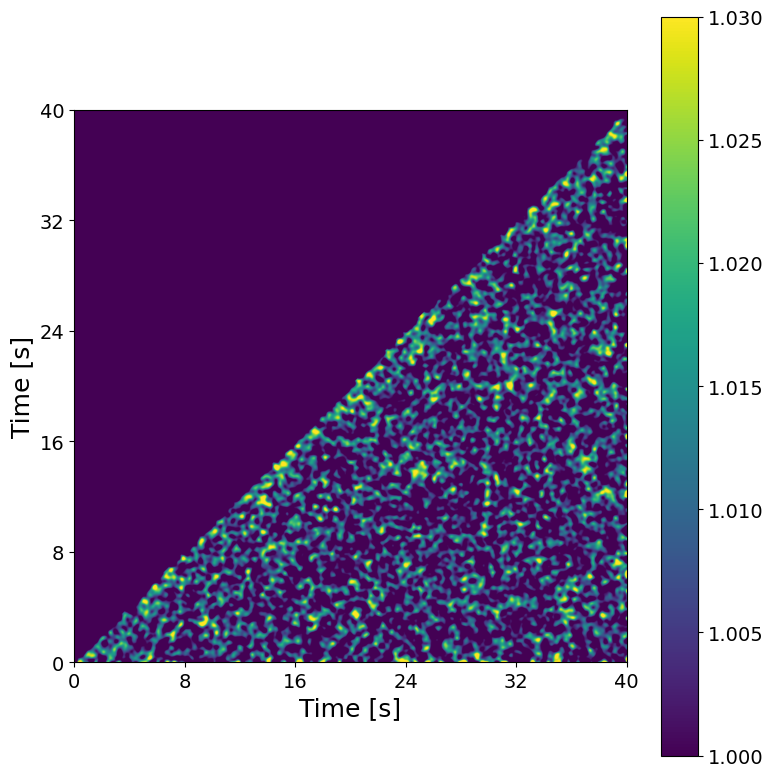

In [308]:
############################
t1, t2 = 0, 40
vmin, vmax = 1.0, 1.03
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=7)

In [309]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 5.62 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


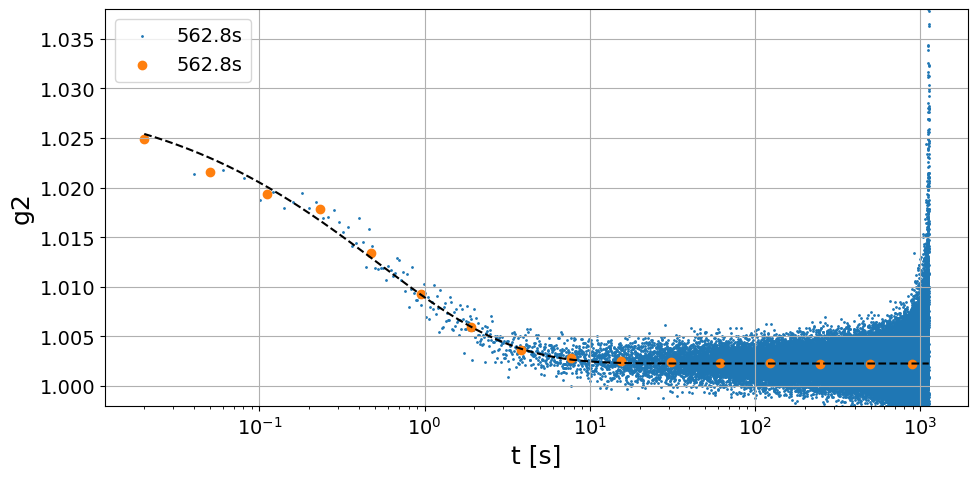

tau = 0.5225 +/- 0.1697
beta = 0.5373 +/- 0.0729
c = 0.0275 +/- 0.0041
y0 = 1.0023 +/- 0.0


In [310]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan ( T = 660 C, Q =  0.19 Å$^{-1}$, 20 min @ 20ms (60000fm)) (GeO2_6, dataset 1, scan 1)

In [311]:
#######################################
sample_name = 'GeO2_6_660C'
Ndataset = 1
Nscan = 1
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loops)
Done!
Conc

### Flux check

In [312]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [313]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

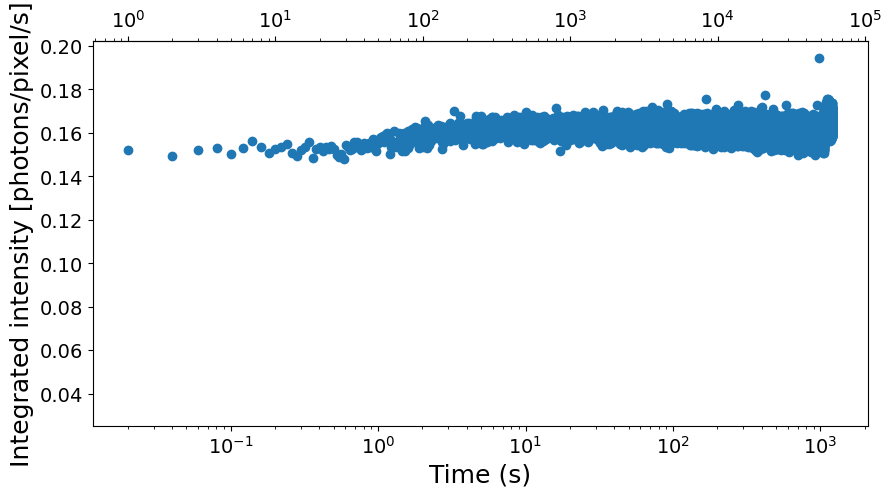

In [314]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.xscale('log')

### Correlation

In [315]:
###################
Nfi = 4000
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 2.7 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 16.07 s)
	 | 56000 X 56000 squared matrix
	 | memory usage (np.array @ float32) = 11.683 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.53 s)



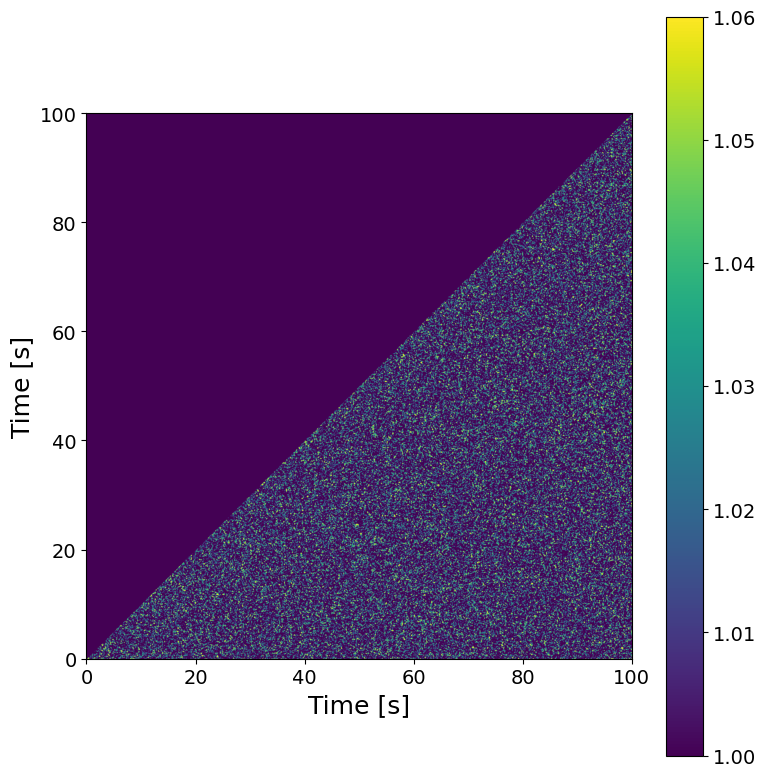

In [316]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [317]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 5.77 s)



/tmp/ipykernel_70247/3855084477.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


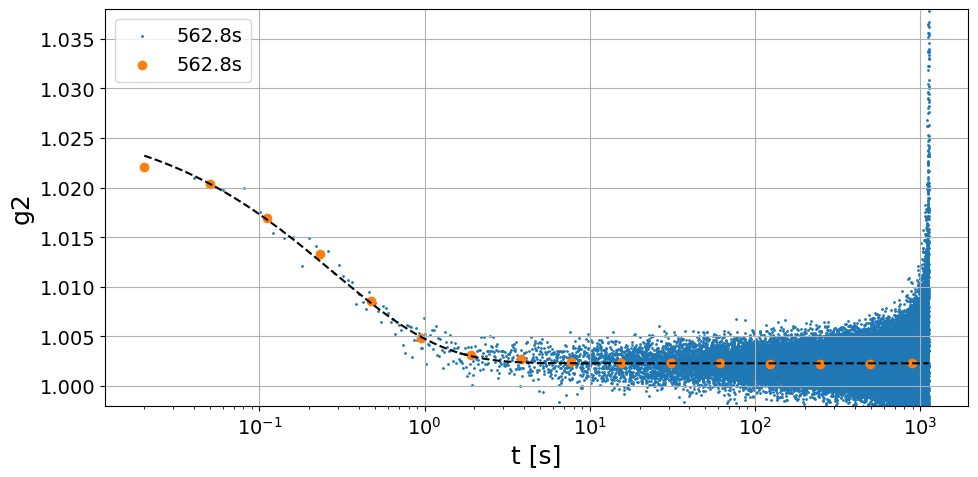

tau = 0.2797 +/- 0.1348
beta = 0.658 +/- 0.1771
c = 0.025 +/- 0.0065
y0 = 1.0023 +/- 0.0


In [318]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan (T = 730 C, Q =  0.19 Å$^{-1}$, 20 min @ 2ms (200000fm)) (GeO2_6, dataset 1, scan 1) 

In [319]:
#######################################
sample_name = 'GeO2_6_730C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.002 1 199804
Ei = 9.699998837562536
itime = 0.0021
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/40 loops)
	 -> loadi

### Flux check

In [320]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [321]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

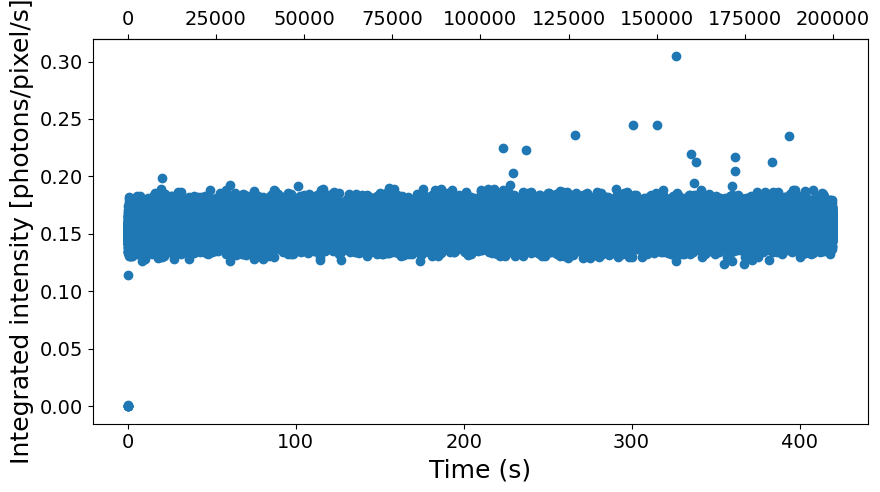

In [322]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [323]:
###################
Nfi = 2
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 0.96 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 16.46 s)
	 | 199802 X 199802 squared matrix
	 | memory usage (np.array @ float32) = 148.717 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 14.05 s)



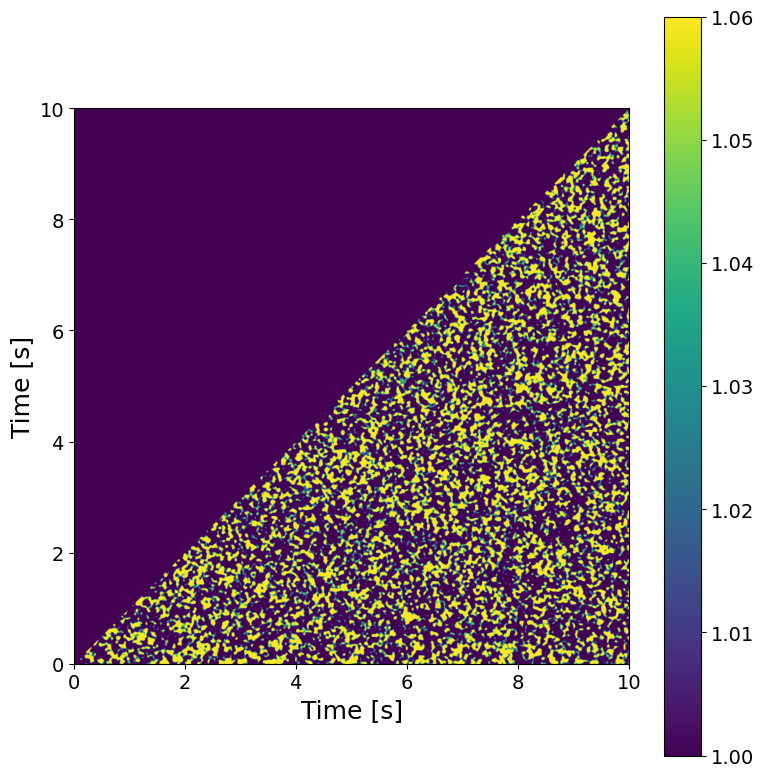

In [324]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [325]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 67.98 s)



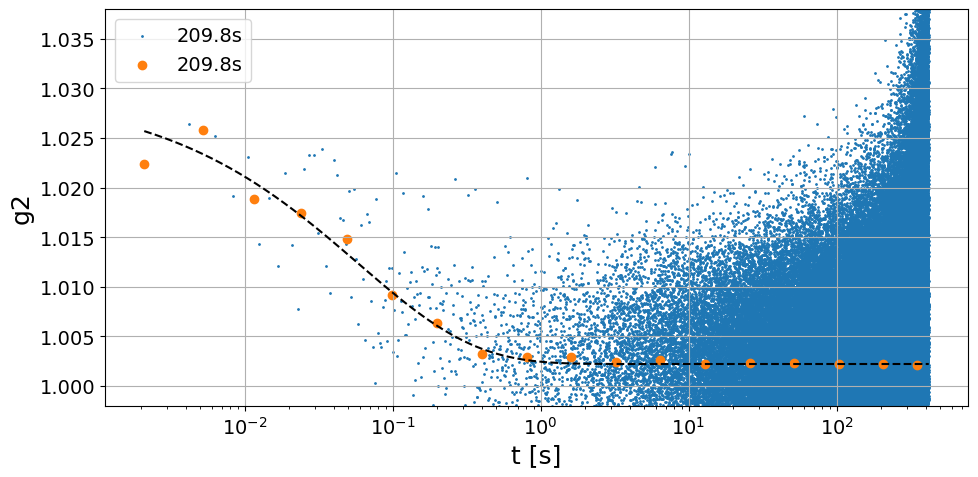

tau = 0.0587 +/- 0.0855
beta = 0.5523 +/- 0.3507
c = 0.0275 +/- 0.0189
y0 = 1.0022 +/- 0.0


In [326]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan (T = 660 C, Q =  0.19 Å$^{-1}$, 20 min @ 2ms (200000fm)) (GeO2_6, dataset 2, scan 1) 

In [327]:
#######################################
sample_name = 'GeO2_6_660C'
Ndataset = 2
Nscan = 3
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.002 1 199804
Ei = 9.699998837562536
itime = 0.0021
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/40 loops)
	 -> loadi

### Flux check

In [328]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [329]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

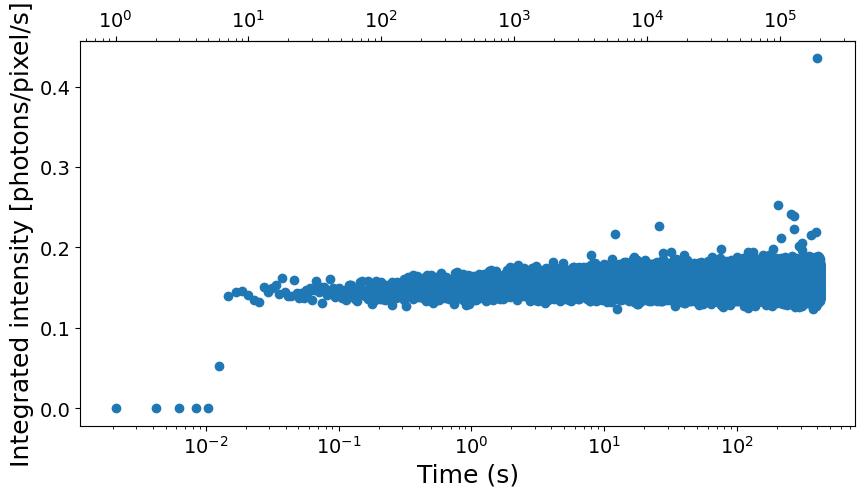

In [330]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.xscale('log')

### Correlation

In [331]:
###################
Nfi = 4000
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 0.99 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 15.84 s)
	 | 195804 X 195804 squared matrix
	 | memory usage (np.array @ float32) = 142.825 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 13.46 s)



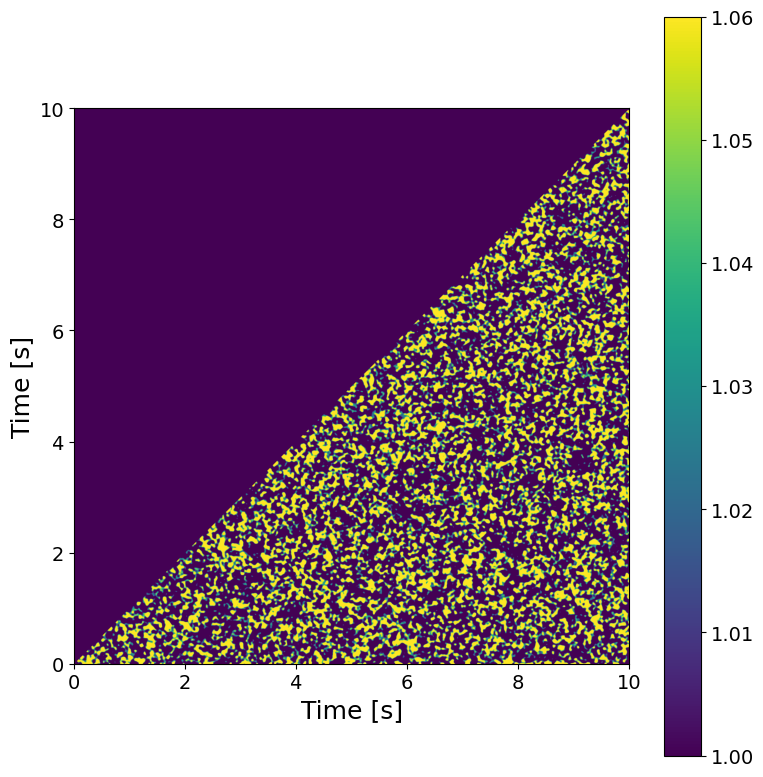

In [332]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [333]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 66.58 s)



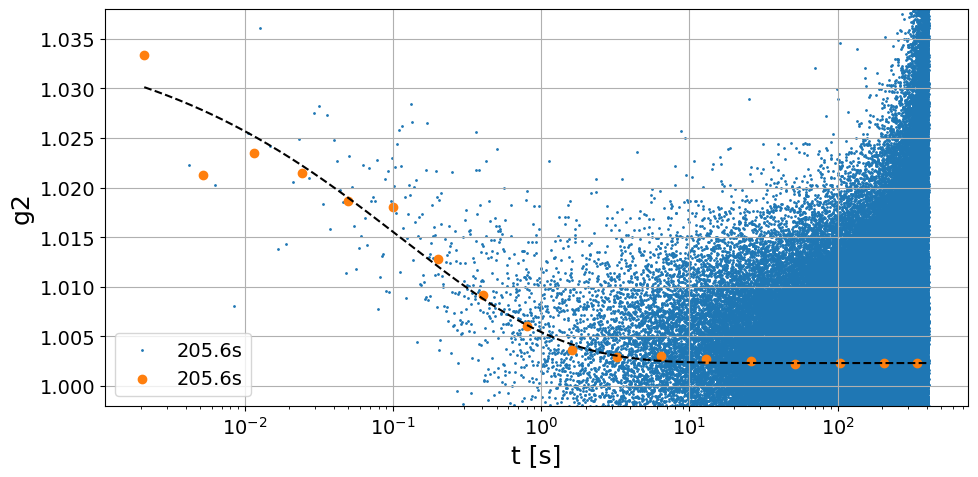

tau = 0.1163 +/- 0.1427
beta = 0.4039 +/- 0.1363
c = 0.0339 +/- 0.0159
y0 = 1.0023 +/- 0.0


In [334]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()

##  XPCS scan (T = 590 C, Q =  0.19 Å$^{-1}$, 20 min @ 2ms (200000fm)) (GeO2_6, dataset 2, scan 1) 

In [335]:
#######################################
sample_name = 'GeO2_6_590C'
Ndataset = 2
Nscan = 3
Nfi, Nff = None, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, mask=mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)
e4m_data = e4m_data.astype(np.float32)

#############################
command = mtimescan 0.002 1 199804
Ei = 9.699998837562536
itime = 0.0021
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/40 loops)
	 -> loadi

### Flux check

In [336]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nff=1000, e4m_mask=e4m_mask * e4m_htmask * bs_mask)

### Intensity analysis

In [337]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

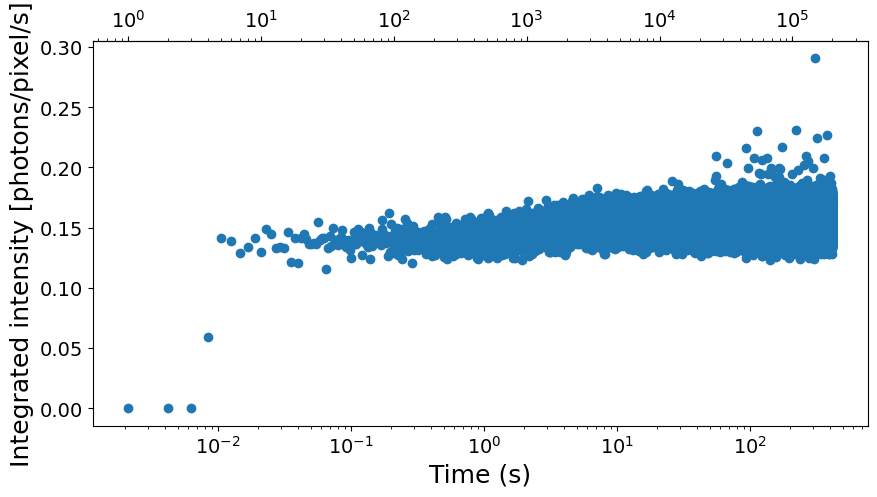

In [338]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.xscale('log')

### Correlation

In [339]:
###################
Nfi = 4000
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 1.02 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 16.11 s)
	 | 195804 X 195804 squared matrix
	 | memory usage (np.array @ float32) = 142.825 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 13.72 s)



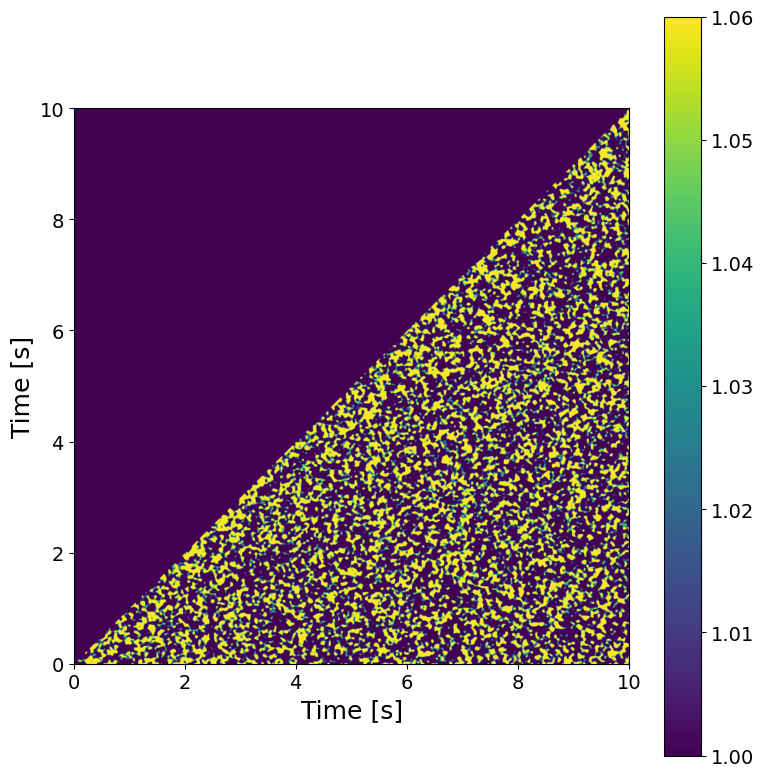

In [340]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [341]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])

if Nbunch == 1:
    np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t=t[t_bunch], g2=g2[t_bunch], t_mt=t_mt[t_bunch], g2_mt=g2_mt[t_bunch])

Computing g2...
Done! (elapsed time = 66.51 s)



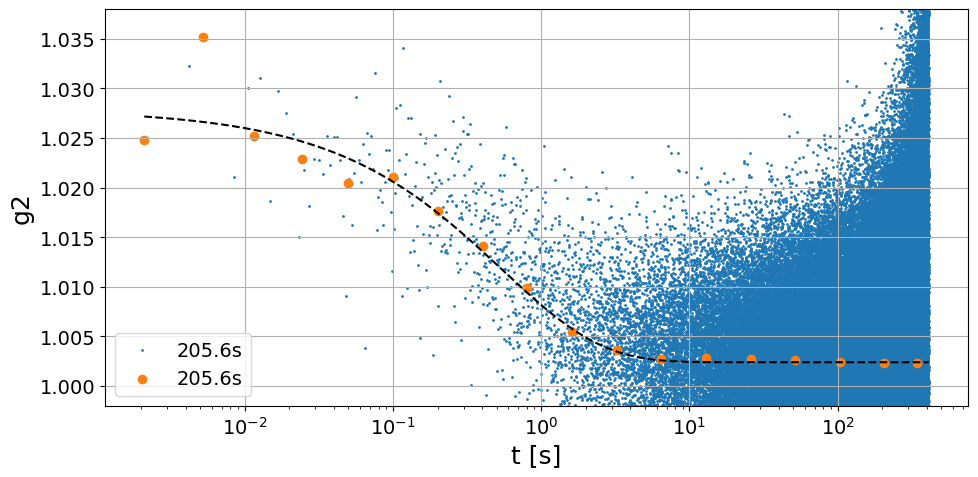

tau = 0.5418 +/- 0.2758
beta = 0.6453 +/- 0.1864
c = 0.0255 +/- 0.0067
y0 = 1.0024 +/- 0.0001


In [342]:
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0']); fit_out.index.name = 't'

plt.figure(figsize=(10,5))
for k in g2.keys():
    if Nbunch == 1: plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k], g2[k], p0=[3, .7, .03, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    X = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    Y = decorelation_f(X, *popt)
    plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.ylim(.998, 1.038)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

if Nbunch == 1:
    fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')
    print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)}')
    print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
    print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
    print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')
else:
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    ax[0, 0].errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    ax[0, 0].set_xlabel('t [s]')
    ax[0, 0].set_ylabel('$\\tau$ [s]')
    ax[0, 1].errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    ax[0, 1].set_xlabel('t [s]')
    ax[0, 1].set_ylabel('$\\beta$')
    ax[1, 0].errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    ax[1, 0].set_xlabel('t [s]')
    ax[1, 0].set_ylabel('$c$')
    ax[1, 1].errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    ax[1, 1].set_xlabel('t [s]')
    ax[1, 1].set_ylabel('$y_0$')
    plt.tight_layout()
    plt.show()